In [1]:
import sys
!{sys.executable} -m pip install gitpython
!{sys.executable} -m pip install pyvis

In [8]:

import os
cwd = os.getcwd()
print(cwd)


# Let's declare a var for the path where we're going to download a repository
# Warning: this must end in /
CODE_ROOT_FOLDER="c:/Users/madsg/Uni/Software_architecture/Software_architecture_individual/code_individual_5/content/zeeguu-api/"

from git import Repo
# GitPython is a library that allows us to work easily with git from Python
# https://gitpython.readthedocs.io/en/stable/tutorial.html


# If the file exists, it means we've already downloaded
if not os.path.exists(CODE_ROOT_FOLDER):
  Repo.clone_from("https://github.com/zeeguu/api", CODE_ROOT_FOLDER)

c:\Users\madsg\Uni\Software_architecture\Software_architecture_individual\code_individual_5


In [10]:
# helper function to get a file path w/o having to always provide the /content/zeeguu-api/ prefix
def file_path(file_name):
    return CODE_ROOT_FOLDER+file_name


In [11]:
# extracting a module name from a file name
def module_name_from_file_path(full_path):

    # e.g. ../core/model/user.py -> zeeguu.core.model.user

    file_name = full_path[len(CODE_ROOT_FOLDER):]
    file_name = file_name.replace("/__init__.py","")
    file_name = file_name.replace("/",".")
    file_name = file_name.replace(".py","")
    return file_name

assert 'zeeguu.core.model.user' == module_name_from_file_path(file_path('zeeguu/core/model/user.py'))

In [12]:
# naïve way of extracting imports using regular expressions
import re


# we assume that imports are always at the
# TODO for you: add full support for imports; this is not complete...
def import_from_line(line):

    # regex patterns used
    #   ^  - beginning of line
    #   \S - anything that is not space
    #   +  - at least one occurrence of previous
    #  ( ) - capture group (read more at: https://pynative.com/python-regex-capturing-groups/)
    try:
      y = re.search("^from (\S+)", line)
      if not y:
        y = re.search("^import (\S+)", line)
      return y.group(1)
    except:
      return None


# extracts all the imported modules from a file
# returns a module of the form zeeguu_core.model.bookmark, e.g.
def imports_from_file(file):

    all_imports = []

    lines = [line for line in open(file)]

    for line in lines:
        imp = import_from_line(line)

        if imp:
            all_imports.append(imp)

    return all_imports

imports_from_file(file_path('zeeguu/core/model/user.py'))

<>:15: SyntaxWarning: invalid escape sequence '\S'
<>:17: SyntaxWarning: invalid escape sequence '\S'
<>:15: SyntaxWarning: invalid escape sequence '\S'
<>:17: SyntaxWarning: invalid escape sequence '\S'
C:\Users\madsg\AppData\Local\Temp\ipykernel_35468\1594463815.py:15: SyntaxWarning: invalid escape sequence '\S'
  y = re.search("^from (\S+)", line)
C:\Users\madsg\AppData\Local\Temp\ipykernel_35468\1594463815.py:17: SyntaxWarning: invalid escape sequence '\S'
  y = re.search("^import (\S+)", line)


['datetime',
 'json',
 'random',
 're',
 'sqlalchemy.orm',
 'zeeguu.core',
 'sqlalchemy',
 'sqlalchemy.orm',
 'sqlalchemy.orm.exc',
 'zeeguu.core.language.difficulty_estimator_factory',
 'zeeguu.core.model.language',
 'zeeguu.core.model.learning_cycle',
 'zeeguu.logging',
 'zeeguu.core.util',
 'zeeguu.core.model',
 'zeeguu.logging']

In [13]:
# test
print(imports_from_file(file_path('zeeguu/core/model/bookmark.py')))
print(imports_from_file(file_path('zeeguu/core/model/unique_code.py')))

['datetime', 'sqlalchemy', 'sqlalchemy', 'sqlalchemy.orm', 'sqlalchemy.orm.exc', 'zeeguu.core.model.caption', 'zeeguu.core.model.video', 'zeeguu.logging', 'zeeguu.core.bookmark_quality.fit_for_study', 'zeeguu.core.model.article', 'zeeguu.core.model.exercise', 'zeeguu.core.model.exercise_outcome', 'zeeguu.core.model.exercise_source', 'zeeguu.core.model.language', 'zeeguu.core.model.source', 'zeeguu.core.model.text', 'zeeguu.core.model.user', 'zeeguu.core.model.user_word', 'zeeguu.core.model.learning_cycle', 'zeeguu.core.model.bookmark_user_preference', 'zeeguu.core.model.bookmark_context', 'zeeguu.core.model', 'zeeguu.core.util.encoding', 'wordstats']
['datetime', 'random', 'zeeguu.core', 'sqlalchemy', 'zeeguu.core.model']


In [14]:
import pathlib
from pathlib import Path
import networkx as nx

def dependencies_graph(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.Graph()

    for file in files:
        file_path = str(file)

        module_name = module_name_from_file_path(file_path)

        if module_name not in G.nodes:
            G.add_node(module_name)

        for each in imports_from_file(file_path):
            G.add_edge(module_name, each)

    return G

In [15]:
import matplotlib.pyplot as plt

# a function to draw a graph
def draw_graph(G, size, **args):
    plt.figure(figsize=size)
    nx.draw_kamada_kawai(G, **args)
    plt.show()

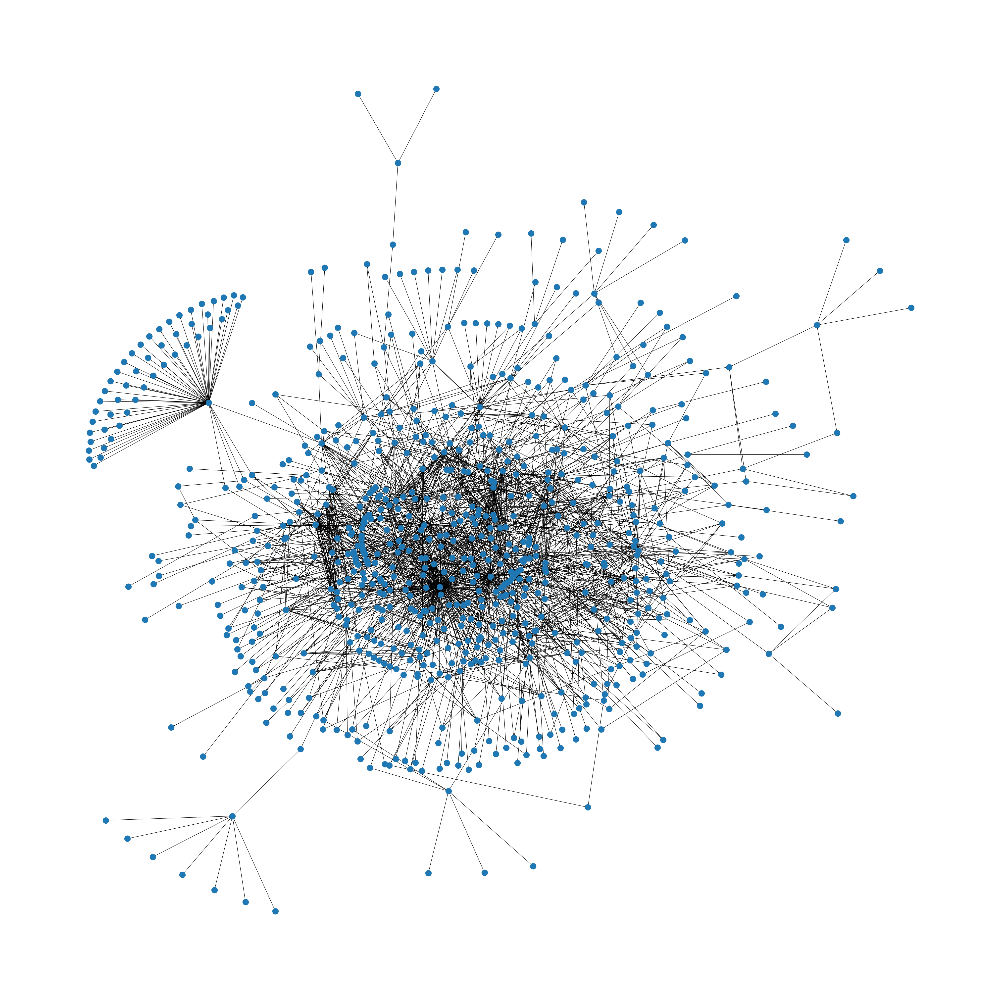

In [16]:
G = dependencies_graph(CODE_ROOT_FOLDER)
draw_graph(G, (40,40), with_labels=False)

ABSTRACTION

In [17]:
# Let's define some relevant modules
def relevant_module(module_name):

  if "test" in module_name:
    return False


  if module_name.startswith("zeeguu"):
    return True


  return False

In [18]:
# However, if we think a bit more about it, we realize that a dependency graph
# is a directed graph (e.g. module A depends on m)
# with any kinds of graph either directed (nx.DiGraph) or
# non-directed (nx.Graph)

def dependencies_digraph(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.DiGraph()

    for file in files:
        file_path = str(file)

        source_module = module_name_from_file_path(file_path)
        if not relevant_module(source_module):
          continue

        if source_module not in G.nodes:
            G.add_node(source_module)

        for target_module in imports_from_file(file_path):

            if relevant_module(target_module):
              G.add_edge(source_module, target_module)


    return G


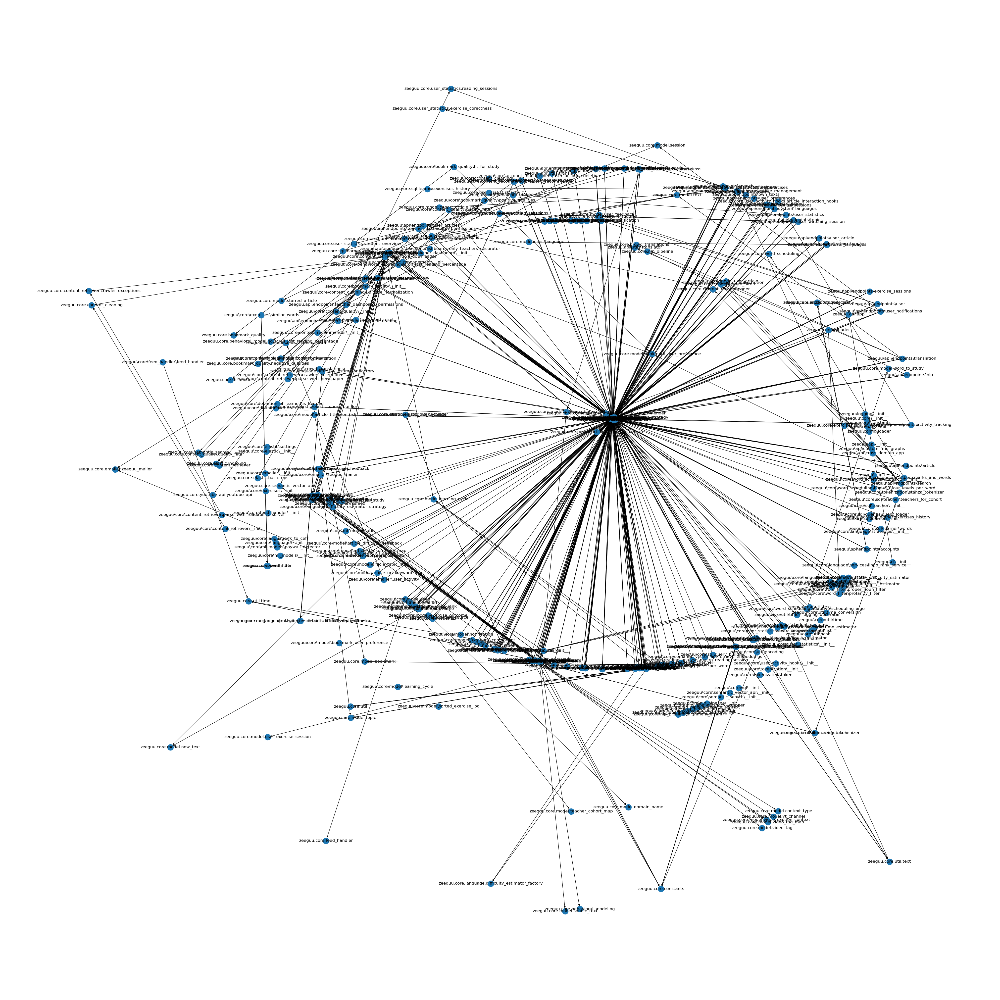

In [19]:
# Looking at the directed graph
DG = dependencies_digraph(CODE_ROOT_FOLDER)
draw_graph(DG, (40,40), with_labels=True)

In [20]:
# extracts the parent of depth X
def top_level_package(module_name, depth=1):
    components = module_name.split(".")
    return ".".join(components[:depth])

assert (top_level_package("zeeguu.core.model.util", 1) == "zeeguu")
assert (top_level_package("zeeguu.core.model.util", 2) == "zeeguu.core")

In [21]:
def abstracted_to_top_level(G, depth=1):
    aG = nx.DiGraph()
    for each in G.edges():
        src = top_level_package(each[0], depth)
        dst = top_level_package(each[1], depth)

        if src != dst:
          aG.add_edge(src, dst)

    return aG

In [22]:
ADG = abstracted_to_top_level(DG, 3)

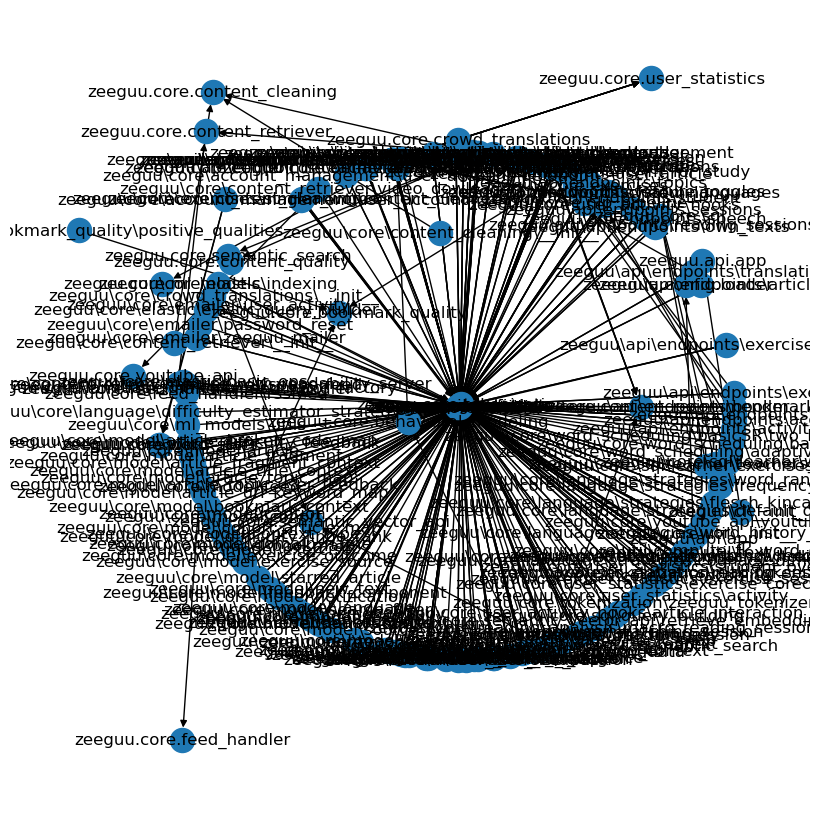

In [23]:
draw_graph(ADG, (8,8), with_labels=True)